
## Chest X-Ray Mask Segmentation Project Summary

1. **Dataset Acquisition**:
    - I obtained the dataset from Kaggle using the Kaggle API.
    - The dataset is named `nikhilpandey360/chest-xray-masks-and-labels`.

2. **Data Preparation and Augmentation**:
    - Data preprocessing steps included:
        - Applying augmentation techniques (such as flipping) to enhance the dataset.
        - Ensuring data consistency and quality.

3. **Model Architecture**:
    - I experimented with two residual ResNets:
        - **Conventional ResNet**:
            - Utilized standard CNN layers.
            - Captured hierarchical features through residual connections.
        - **Depthwise Separable ResNet**:
            - Employed depthwise separable convolutions for efficiency.
            - Reduced the number of parameters while maintaining performance.

4. **Performance Evaluation**:
    - I assessed model performance using the **Dice coefficient** (F1 score).
    - This metric quantifies the overlap between predicted and true positive regions.

5. **Visualization**:
    - To gain insights and validate predictions, you created segmentation figures.
    - These visualizations helped evaluate the accuracy of abnormal region identification.

## Next Steps:
- Consider fine-tuning hyperparameters, exploring additional architectures, or incorporating other evaluation metrics.
- Continue refining the model based on performance and domain-specific requirements.

Remember that medical image segmentation is critical for accurate diagnosis and patient care.

In [ ]:
from google.colab import files
files.upload()


The code snippet that uploads the `kaggle.json` file to gain access for downloading data from Kaggle.


**Description**:
The provided Python code snippet allows users to upload their `kaggle.json` file within a Google Colab environment. This file contains authentication credentials required to access Kaggle datasets programmatically. By executing this code, users can securely authenticate themselves and gain access to download datasets directly from Kaggle.

**Usage Instructions**:
1. Ensure you have the `kaggle.json` file ready (you can obtain it from your Kaggle account settings).
2. Run the provided code snippet in your Google Colab notebook.
3. When prompted, select the `kaggle.json` file for upload.
4. Once uploaded, you'll be able to use Kaggle APIs to download datasets seamlessly.

Remember to keep your `kaggle.json` file confidential and never share it publicly 📊🔍.

In [ ]:
!pip install kaggle
import os
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d nikhilpandey360/chest-xray-masks-and-labels
!unzip chest-xray-masks-and-labels.zip


**Chest X-Ray Masks and Labels Dataset**

This Python code snippet automates the process of downloading and extracting the **"Chest X-Ray Masks and Labels"** dataset from Kaggle. The dataset includes labeled chest X-ray images along with corresponding binary masks indicating the presence of abnormalities (such as pneumonia or tuberculosis).

**Steps Performed by the Code:**

1. **Installation and Setup**:
    - Installs the `kaggle` package using `!pip install kaggle`.
    - Creates a `.kaggle` directory in the user's home folder.
    - Moves the uploaded `kaggle.json` file (containing Kaggle API credentials) to the `.kaggle` directory.
    - Sets appropriate permissions for the `kaggle.json` file.

2. **Dataset Download**:
    - Executes `!kaggle datasets download -d nikhilpandey360/chest-xray-masks-and-labels` to download the dataset ZIP file.
    - The dataset includes chest X-ray images and corresponding binary masks.

3. **Dataset Extraction**:
    - Unzips the downloaded ZIP file using `!unzip chest-xray-masks-and-labels.zip`.
    - Extracts the dataset files (images and masks) to the current working directory.

**Usage Instructions:**

1. Upload your `kaggle.json` file (obtained from Kaggle) to the Colab environment.
2. Run the provided code snippet.
3. The dataset will be downloaded and extracted, making it ready for further analysis or machine learning tasks.



In [7]:
import os
import warnings
import sys
import cv2
from tqdm import tqdm
import matplotlib.pyplot as plt
import random
from sklearn.model_selection import train_test_split
%matplotlib inline
import numpy as np
from urllib.parse import urlparse
import tensorflow
import pandas as pd
from cv2 import imread, createCLAHE
from glob import glob

from urllib.parse import urlparse
import tensorflow as tf
import tensorflow.keras
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras import backend as K
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

In [8]:
image_path_train = "/content/Lung Segmentation/CXR_png"
mask_path_train = "/content/Lung Segmentation/masks"
image_path_test = "/content/Lung Segmentation/test"

images = os.listdir(image_path_train)
mask = os.listdir(mask_path_train)
mask = [fName.split(".png")[0] for fName in mask]
image_file_name = [fName.split("_mask")[0] for fName in mask]

check = [i for i in mask if "mask" in i]
print("Total mask that has modified name:", len(check))

testing_files = set(os.listdir(image_path_train)) & set(os.listdir(mask_path_train))
training_files = check

Total mask that has modified name: 566


**Chest X-Ray Masks and Labels Dataset Preprocessing**

This Python code snippet performs essential preprocessing steps for the **"Chest X-Ray Masks and Labels"** dataset. The dataset contains chest X-ray images and corresponding binary masks, which indicate abnormal regions (such as pneumonia or tuberculosis).

**Steps Performed by the Code**:

1. **File Paths**:
    - Defines the following paths:
        - `image_path_train`: Directory containing training images.
        - `mask_path_train`: Directory containing training masks.
        - `image_path_test`: Directory containing testing images.

2. **File Matching and Data Integrity Check**:
    - Lists the files in the training image directory (`image_path_train`) and the mask directory (`mask_path_train`).
    - Matches the filenames by removing the "_mask" suffix from the mask filenames.
    - Creates a list of image file names (`image_file_name`) corresponding to the masks.
    - Ensures that the mask filenames have been modified correctly (i.e., contain the "mask" keyword).
    - Prints the total number of masks with modified names.

3. **Data Split**:
    - Identifies the common files between training images and masks (i.e., the files available for both training and validation).
    - Sets `testing_files` as the intersection of training image files and mask files.
    - Sets `training_files` as the list of modified mask filenames.

**Usage Instructions**:

1. Ensure that the dataset directories (`image_path_train`, `mask_path_train`, and `image_path_test`) are correctly set.
2. Execute the provided code snippet to perform file matching and data integrity checks.
3. Use the resulting `training_files` list for further data processing or model training.


In [9]:
def load_and_preprocess_data(X_shape, flag="Valid"):
    im_array = []
    mask_array = []
    shape = (X_shape, X_shape)

    def load_image(image_path):
        img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, shape)
        img = cv2.equalizeHist(img)
        return img

    if flag == "Valid":
        for i in tqdm(testing_files):
            im = load_image(os.path.join(image_path_train, i))
            mask = load_image(os.path.join(mask_path_train, i))
            im_array.append(im)
            mask_array.append(mask)

    if flag == "Train":
        for i in tqdm(training_files):
            im = load_image(os.path.join(image_path_train, i.split("_mask")[0] + ".png"))
            mask = load_image(os.path.join(mask_path_train, i + ".png"))
            im_array.append(im)
            mask_array.append(mask)

    return im_array, mask_array

In [10]:
def get_test(X_shape, n_samples = 100):
    im_array = []
    shape = (X_shape, X_shape)
    test_files = random.choices(list(os.listdir(image_path_test)), k=n_samples)
    for i in tqdm(test_files):
        im = cv2.imread(os.path.join(image_path_test, i), cv2.IMREAD_GRAYSCALE)
        im = cv2.resize(im, shape)
        im = cv2.equalizeHist(im)
        im_array.append(im)
    return im_array

In [11]:
dim, n_samples = 256, 50

X_shape = 256
image_Train, mask_Train = load_and_preprocess_data(X_shape, flag="Train")
image_Valid, mask_Valid = load_and_preprocess_data(X_shape, flag="Valid")
X_test = get_test(dim, n_samples = n_samples)

100%|██████████| 50/50 [00:09<00:00,  5.34it/s]


The provided code snippet that facilitates data loading and preprocessing for the **"Chest X-Ray Masks and Labels"** dataset:

## Chest X-Ray Masks and Labels Dataset Preprocessing

This Python code snippet performs essential preprocessing steps for the **"Chest X-Ray Masks and Labels"** dataset. The dataset contains chest X-ray images and corresponding binary masks, which indicate abnormal regions (such as pneumonia or tuberculosis).

### Steps Performed by the Code:

1. **Data Loading and Preprocessing**:
    - Defines the `load_and_preprocess_data` function.
    - Accepts the following parameters:
        - `X_shape`: Desired image size (e.g., 256x256 pixels).
        - `flag`: Specifies whether to load training or validation data.
    - Loads grayscale chest X-ray images and masks.
    - Resizes images and masks to the specified `X_shape`.
    - Enhances image contrast using histogram equalization.
    - Returns preprocessed image and mask arrays.

2. **Training Data Preparation**:
    - Calls `load_and_preprocess_data` with `flag="Train"` to load and preprocess training data.
    - Creates `image_Train` and `mask_Train` arrays containing training images and masks, respectively.

3. **Validation Data Preparation**:
    - Calls `load_and_preprocess_data` with `flag="Valid"` to load and preprocess validation data.
    - Creates `image_Valid` and `mask_Valid` arrays containing validation images and masks, respectively.

4. **Test Data Preparation**:
    - Defines the `get_test` function.
    - Accepts the following parameters:
        - `X_shape`: Desired image size (e.g., 256x256 pixels).
        - `n_samples`: Number of test samples to generate.
    - Randomly selects test files from the testing image directory.
    - Loads and preprocesses test images.
    - Creates `X_test` array containing test images.

### Usage Instructions:

1. Ensure that the dataset directories (`image_path_train`, `mask_path_train`, and `image_path_test`) are correctly set.
2. Set the desired image size (`X_shape`) and the number of test samples (`n_samples`).
3. Execute the provided code snippet to load and preprocess the data.
4. Use the resulting arrays (`image_Train`, `mask_Train`, `image_Valid`, `mask_Valid`, and `X_test`) for training, validation, and testing.



In [12]:
image_Train = np.array(image_Train).reshape(len(image_Train), dim, dim, 1)
mask_Train = np.array(mask_Train).reshape(len(mask_Train), dim, dim, 1)

image_Valid = np.array(image_Valid).reshape(len(image_Valid), dim, dim, 1)
mask_Valid = np.array(mask_Valid).reshape(len(mask_Valid), dim, dim, 1)

X_test = np.array(X_test).reshape(len(X_test), dim, dim, 1)

print(image_Train.shape, mask_Train.shape)
print(image_Valid.shape, mask_Valid.shape)
print(X_test.shape)

(566, 256, 256, 1) (566, 256, 256, 1)
(138, 256, 256, 1) (138, 256, 256, 1)
(50, 256, 256, 1)


In [13]:
assert image_Train.shape == mask_Train.shape
assert image_Valid.shape == mask_Valid.shape
images = np.concatenate((image_Train, image_Valid), axis=0)
masks  = np.concatenate((mask_Train, mask_Valid), axis=0)

print(images.shape, masks.shape)

(704, 256, 256, 1) (704, 256, 256, 1)


# Data Augmetation



## Chest X-Ray Data Augmentation

This Python code snippet performs data augmentation techniques on the **"Chest X-Ray Masks and Labels"** dataset. Data augmentation is crucial for improving model generalization and robustness. The dataset contains chest X-ray images and corresponding binary masks, which indicate abnormal regions (such as pneumonia or tuberculosis).

### Data Augmentation Techniques Applied:

1. **Contrast Adjustment**:
    - The `contrast_images_cv2` function adjusts the contrast of each image using the following formula:
        - Adjusted Image = α × Original Image + β
    - Parameters:
        - `α` (alpha): Increased from 1.5 to 2.0 for stronger contrast.
        - `β` (beta): Increased from 0.7 to 100 for brightness adjustment.
    - Result:
        - Creates `contrast_images` by applying contrast adjustments to the original images.

2. **Gaussian Blur**:
    - The `gaussian_blur_images` function applies Gaussian blur to each image.
    - Parameters:
        - `kernel_size`: Set to (3, 3) for a small kernel.
        - `sigma_x`: Set to 0 (no additional smoothing).
    - Result:
        - Creates `blurred_images` by applying Gaussian blur to the original images.

3. **Horizontal Flipping**:
    - The `horizontal_flip_cv2` function flips each image horizontally.
    - Result:
        - Creates `flipped_images` by horizontally flipping the original images.
        - Creates `flipped_masks` by horizontally flipping the corresponding masks.

### Usage Instructions:

1. Ensure that the original image and mask arrays (`images` and `masks`) have been loaded and preprocessed.
2. Execute the provided code snippet to apply data augmentation techniques.
3. Use the augmented arrays (`contrast_images`, `blurred_images`, `flipped_images`, and `flipped_masks`) for training and validation.

Remember that data augmentation helps improve model performance by introducing variations in the training data.

Let's delve deeper into the concept of **horizontal flipping** in the context of image data augmentation.

## Horizontal Flipping (Mirroring)

**Horizontal flipping** is a common data augmentation technique used in computer vision tasks. It involves creating new training samples by horizontally mirroring existing images. Here's how it works:

1. **Original Image**:
    - Suppose we have an original image (e.g., a chest X-ray) with certain features, structures, and abnormalities.

2. **Flipped Image**:
    - To augment the dataset, we create a new image by flipping the original horizontally.
    - The left side of the original image becomes the right side in the flipped image, and vice versa.
    - The top-to-bottom arrangement remains unchanged.

3. **Purpose and Benefits**:
    - **Increased Variability**: By introducing flipped versions of the same image, we increase the variability in the training data.
    - **Robustness**: Models trained on augmented data are more robust to variations in object orientation and viewpoint.
    - **Generalization**: Augmentation helps prevent overfitting by providing more diverse examples for the model to learn from.

4. **Application to Chest X-Rays**:
    - In the context of chest X-rays, horizontal flipping can simulate different patient orientations (e.g., left-facing vs. right-facing).
    - It ensures that the model learns to recognize abnormalities regardless of their spatial arrangement within the image.

5. **Implementation**:
    - In the provided code snippet, the `horizontal_flip_cv2` function applies horizontal flipping using OpenCV (`cv2.flip(img, 1)`).
    - The resulting `flipped_images` and `flipped_masks` arrays contain horizontally flipped versions of the original images and masks.

### Usage Considerations:

- **Use with Caution**: Not all tasks benefit equally from horizontal flipping. For some applications (e.g., text recognition), flipping may not be appropriate.
- **Domain-Specific**: Consider the domain-specific implications. For medical images, ensure that anatomical correctness is preserved after flipping.

Remember to experiment with different augmentation techniques and find the right balance for your specific use case. Happy modeling!

In [14]:
# Assuming 'images' and 'masks' are already defined arrays of images and masks

def contrast_images_cv2(images, alpha, beta):
    contrast_images_v2 = []
    for img in images:
        # Apply the contrast adjustment
        adjusted_image = cv2.addWeighted(img, alpha, img, 0, beta)
        contrast_images_v2.append(adjusted_image)
    return contrast_images_v2

# Function to apply Gaussian blur to an array of images
def gaussian_blur_images(images, kernel_size=(3, 3), sigma_x=0):
    blurred_images = []
    for img in tqdm(images, "Applying Gaussian Blur"):
        blurred_images.append(cv2.GaussianBlur(img, kernel_size, sigma_x))
    return np.array(blurred_images)

# Function to apply horizontal flipping to an array of images using cv2
def horizontal_flip_cv2(images):
    flipped_images = []
    for img in tqdm(images, "Horizontal Flipping"):
        flipped_images.append(cv2.flip(img, 1))  # 1 is the code for horizontal flipping in cv2
    return np.array(flipped_images)

# Apply horizontal flipping to images
flipped_images = horizontal_flip_cv2(images)
flipped_masks = horizontal_flip_cv2(masks)

# Apply Histogram Equalization to the original images and flipped images
alpha = 1.25  # Increase from 1.5 to 2.0
beta = 0.75   # Increase from 0.7 to 100

contrast_images = contrast_images_cv2(images, alpha, beta)
contrast_flipped_images = contrast_images_cv2(flipped_images, alpha, beta)


# Apply Gaussian blur to the original images and flipped images
blurred_images = gaussian_blur_images(images)
blurred_flipped_images = gaussian_blur_images(flipped_images)


Applying Gaussian Blur: 100%|██████████| 704/704 [00:00<00:00, 14551.93it/s]


## Data Reshaping and Augmentation for Chest X-Ray Images

In this section, we perform critical data preprocessing steps to enhance the dataset for training deep learning models. The dataset consists of chest X-ray images and corresponding binary masks, which highlight regions of interest (such as pneumonia or other abnormalities).

### Steps Performed by the Code:

1. **Reshaping Images and Masks**:
    - We reshape the following arrays to have dimensions `(n_samples, 256, 256, 1)`:
        - `flipped_images`: Horizontally flipped versions of the original images.
        - `flipped_masks`: Horizontally flipped versions of the corresponding masks.
        - `blurred_images`: Images with Gaussian blur applied.
        - `blurred_flipped_images`: Horizontally flipped versions of the blurred images.
        - `contrast_images`: Images with adjusted contrast.
        - `contrast_flipped_images`: Horizontally flipped versions of the contrast-adjusted images.

2. **Combining Augmented Data**:
    - We concatenate the following arrays along the first axis (i.e., vertically):
        - Original images (`images`).
        - Flipped images (`flipped_images`).
        - Blurred images (`blurred_images`).
        - Flipped blurred images (`blurred_flipped_images`).
        - Contrast-adjusted images (`contrast_images`).
        - Flipped contrast-adjusted images (`contrast_flipped_images`).
    - The resulting arrays are named `all_images` and `all_masks`.

3. **Data Split for Training and Validation**:
    - We split the combined data into training and validation sets:
        - `X_train`, `Y_train`: Training images and corresponding masks.
        - `X_val`, `Y_val`: Validation images and masks.
    - The data is normalized to the range [-1, 1] by subtracting 127 and dividing by 127.

### Usage Considerations:

- Augmented data provides additional training samples, improves model generalization, and helps prevent overfitting.
- Experiment with different augmentation techniques and hyperparameters to find the optimal balance.



In [15]:
# Reshape augmented images and masks
flipped_images = flipped_images.reshape(len(flipped_images), 256, 256, 1)
flipped_masks = flipped_masks.reshape(len(flipped_masks), 256, 256, 1)
blurred_images = blurred_images.reshape(len(blurred_images), 256, 256, 1)
blurred_flipped_images = blurred_flipped_images.reshape(len(blurred_flipped_images), 256, 256, 1)
contrast_images = np.array(contrast_images).reshape(len(contrast_images), 256, 256, 1)
contrast_flipped_images = np.array(contrast_flipped_images).reshape(len(contrast_flipped_images), 256, 256, 1)

# Concatenate all images and masks
all_images = np.concatenate((images, flipped_images, blurred_images, blurred_flipped_images, contrast_images, contrast_flipped_images), axis=0)
all_masks = np.concatenate((masks, flipped_masks, masks, flipped_masks, masks, flipped_masks), axis=0)

# Print the shape of the concatenated arrays
print(f'Shape of all images: {all_images.shape}')
print(f'Shape of all masks: {all_masks.shape}')

# Split data into training and validation sets
X_train, X_val, Y_train, Y_val = train_test_split((all_images - 127.0) / 127.0,
                                                  (all_masks > 127).astype(np.float32),
                                                  test_size=0.2,
                                                  random_state=42)

# Normalize test data
X_testNorm = (X_test - 127.0) / 127.0

print(f'Shape of train set: {X_train.shape}')
print(f'Shape of validation set: {X_val.shape}')

Shape of all images: (4224, 256, 256, 1)
Shape of all masks: (4224, 256, 256, 1)
Shape of train set: (3379, 256, 256, 1)
Shape of validation set: (845, 256, 256, 1)


## Displaying Augmented Images and Masks

In this section, we visualize the augmented versions of chest X-ray images and their corresponding masks. The augmentation techniques applied include contrast adjustment, Gaussian blur, and horizontal flipping.

### Explanation:

1. **Function Overview**:
    - The `display_images` function takes a list of indices as input.
    - For each index, it displays a set of images and their augmented versions side by side.

2. **Image Categories**:
    - For each index `i`, we display the following images:
        - **Original Image**: The original chest X-ray image.
        - **Blurred Image**: The image with Gaussian blur applied.
        - **Contrast-Adjusted Image**: The image with adjusted contrast.
        - **Mask**: The binary mask corresponding to the abnormal regions in the original image.
        - **Flipped Original Image**: The horizontally flipped version of the original image.
        - **Flipped Blurred Image**: The horizontally flipped version of the blurred image.
        - **Flipped Contrast-Adjusted Image**: The horizontally flipped version of the contrast-adjusted image.
        - **Flipped Mask**: The horizontally flipped version of the mask.

3. **Visualization**:
    - We create a 2x4 grid of subplots to display the images.
    - Each subplot shows an image category with an appropriate title.
    - The layout is adjusted for readability.

### Usage Considerations:

- Use this visualization to inspect the effects of data augmentation on the chest X-ray images.
- Ensure that the augmented images preserve relevant features and maintain anatomical correctness.



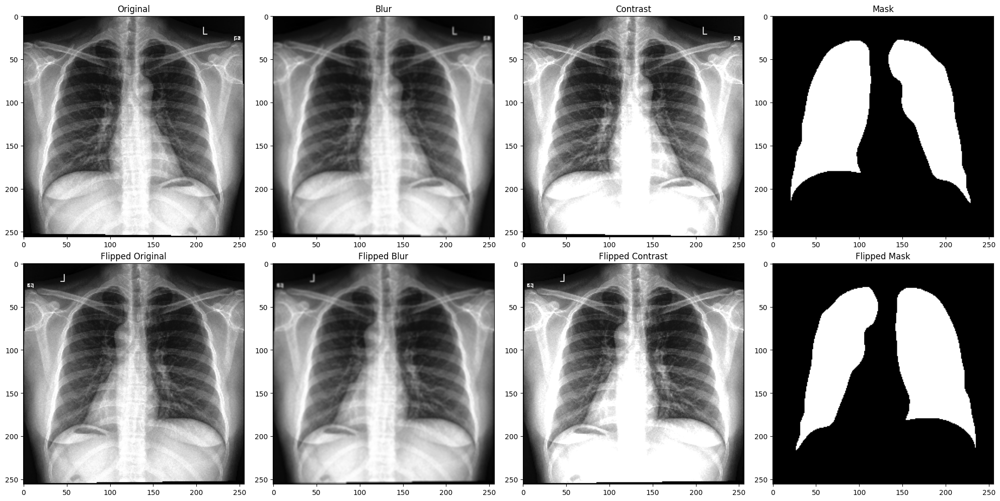

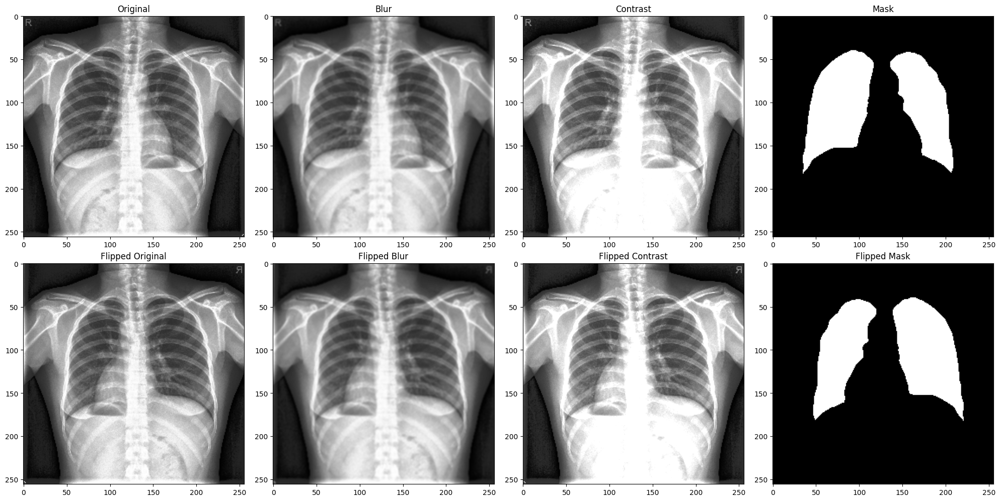

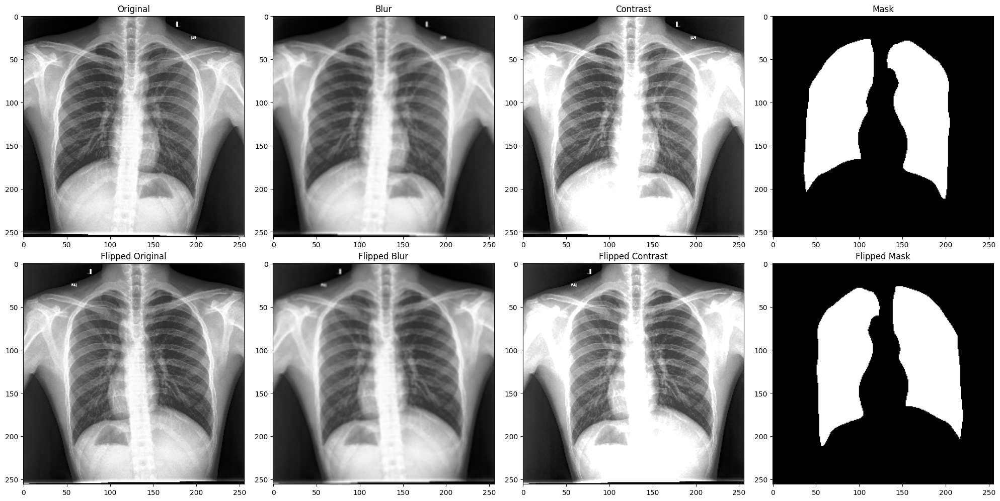

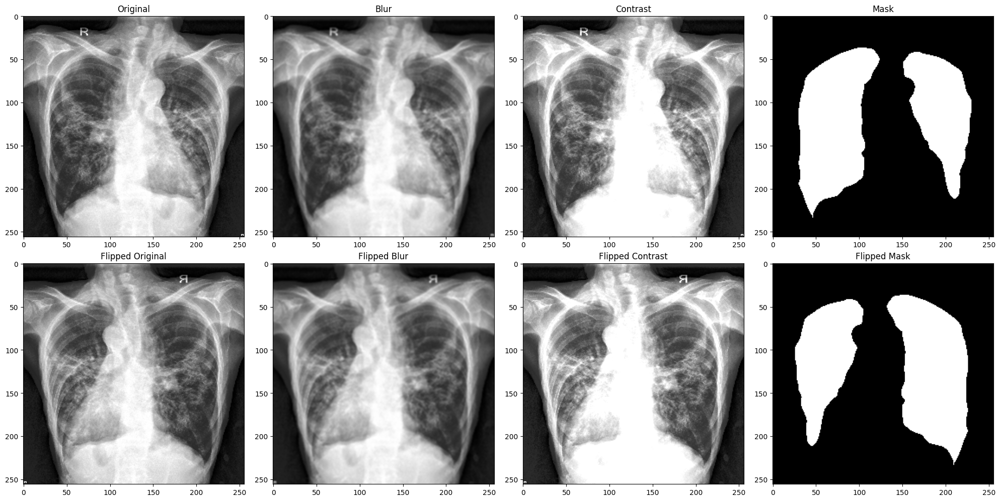

In [12]:
import matplotlib.pyplot as plt

# Assuming 'images', 'blurred_images', 'contrast_images', 'masks', 'flipped_images', 'blurred_flipped_images', 'contrast_flipped_images', 'flipped_masks' are defined

def display_images(indices):
    for i in indices:
        # Create a figure with subplots
        fig, axs = plt.subplots(2, 4, figsize=(20, 10))  # 2 rows, 4 columns

        # Original image
        axs[0, 0].imshow(images[i].reshape(256, 256), cmap='gray')
        axs[0, 0].set_title('Original')

        # Blurred image
        axs[0, 1].imshow(blurred_images[i].reshape(256, 256), cmap='gray')
        axs[0, 1].set_title('Blur')

        # Contrast image
        axs[0, 2].imshow(contrast_images[i].reshape(256, 256), cmap='gray')
        axs[0, 2].set_title('Contrast')

        # Mask
        axs[0, 3].imshow(masks[i].reshape(256, 256), cmap='gray')
        axs[0, 3].set_title('Mask')

        # Flipped image
        axs[1, 0].imshow(flipped_images[i].reshape(256, 256), cmap='gray')
        axs[1, 0].set_title('Flipped Original')

        # Blurred flipped image
        axs[1, 1].imshow(blurred_flipped_images[i].reshape(256, 256), cmap='gray')
        axs[1, 1].set_title('Flipped Blur')

        # Contrast flipped image
        axs[1, 2].imshow(contrast_flipped_images[i].reshape(256, 256), cmap='gray')
        axs[1, 2].set_title('Flipped Contrast')

        # Flipped mask
        axs[1, 3].imshow(flipped_masks[i].reshape(256, 256), cmap='gray')
        axs[1, 3].set_title('Flipped Mask')

        # Adjust layout
        plt.tight_layout()
        plt.show()

# Call the function with indices 1, 10, 100, 150
display_images([1, 10, 100, 150])


# Residual U-Net Model


## Dice Coefficient (F1 Score)

- The **Dice coefficient**, also known as the **F1 score**, quantifies the similarity between two sets (in this case, the predicted mask and the ground truth mask).
- It measures the overlap between the predicted and true positive regions.
- Interpretation:
    - A higher Dice coefficient indicates better overlap between the predicted and true positive regions.
    - A value of 1 indicates perfect overlap (complete agreement), while 0 indicates no overlap.

## Jaccard Index (Intersection over Union)

- The **Jaccard index**, also known as the **Intersection over Union (IoU)**, measures the ratio of the intersection area to the union area between two sets.
- It is commonly used in segmentation tasks to evaluate the quality of object localization.
- Interpretation:
    - A higher IoU indicates better localization accuracy.
    - A value of 1 indicates perfect overlap, while 0 indicates no overlap.

## Loss Functions

- The provided code also defines loss functions based on these metrics:
    - `dice_coef_loss`: Complements the Dice coefficient by minimizing its value during training.
    - `jaccard_coef_loss`: Complements the Jaccard index by minimizing its value during training.

### Usage Considerations:

- Choose the appropriate metric (Dice coefficient, Jaccard index, or both) based on your specific segmentation task and evaluation requirements.
- Use the corresponding loss function during model training to optimize the chosen metric.



In [5]:
def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + 1) / (K.sum(y_true_f) + K.sum(y_pred_f) + 1)

def dice_coef_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)

def jaccard_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) - intersection + 1.0)

def jaccard_coef_loss(y_true, y_pred):
    return 1 - jaccard_coef(y_true, y_pred)


## Chest X-Ray Segmentation Model Architecture

In this code snippet, we define several building blocks commonly used in CNN-based segmentation models. These blocks will be assembled to create a complete architecture for segmenting chest X-ray images.

### Key Components:

1. **Batch Normalization and Activation**:
    - The `batch_norm_activation` function applies batch normalization followed by ReLU activation (if specified).
    - Batch normalization helps stabilize training by normalizing layer inputs.
    - ReLU activation introduces non-linearity.

2. **Convolutional Block**:
    - The `convolution_block` function consists of:
        - Batch normalization and ReLU activation.
        - A 2D convolutional layer with specified filters, kernel size, padding, and strides.

3. **Stem Block**:
    - The `stem_block` initializes the network by:
        - Applying a 2D convolutional layer.
        - Adding a residual connection (shortcut) to maintain information flow.
        - Combining the output with the shortcut using element-wise addition.

4. **Residual Block**:
    - The `residual_block` represents a residual unit:
        - Two consecutive convolutional blocks.
        - A residual connection similar to the stem block.

5. **Upsample and Concatenate Block**:
    - The `upsample_concat_block` combines upsampled feature maps with skip connections:
        - Upsamples the feature maps by a factor of 2.
        - Concatenates the upsampled maps with the corresponding skip connection.

### Usage Considerations:

- Assemble these building blocks into a complete CNN architecture for chest X-ray segmentation.
- Adjust hyperparameters (e.g., filters, kernel size) based on your specific task and dataset.



In [14]:
import tensorflow.keras.layers as layers
import tensorflow.keras.models as models

def batch_norm_activation(x, activation=True):
    x = layers.BatchNormalization()(x)
    if activation:
        x = layers.Activation("relu")(x)
    return x

def convolution_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    x = batch_norm_activation(x)
    x = layers.Conv2D(filters, kernel_size, padding=padding, strides=strides)(x)
    return x

def stem_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    x = layers.Conv2D(filters, kernel_size, padding=padding, strides=strides)(x)
    x = convolution_block(x, filters, kernel_size=kernel_size, padding=padding, strides=strides)

    shortcut = layers.Conv2D(filters, kernel_size=(1, 1), padding=padding, strides=strides)(x)
    shortcut = batch_norm_activation(shortcut, activation=False)

    x = layers.Add()([x, shortcut])
    return x

def residual_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    res = convolution_block(x, filters, kernel_size=kernel_size, padding=padding, strides=strides)
    res = convolution_block(res, filters, kernel_size=kernel_size, padding=padding, strides=1)

    shortcut = layers.Conv2D(filters, kernel_size=(1, 1), padding=padding, strides=strides)(x)
    shortcut = batch_norm_activation(shortcut, activation=False)

    x = layers.Add()([shortcut, res])
    return x

def upsample_concat_block(x, xskip):
    u = layers.UpSampling2D((2, 2))(x)
    c = layers.Concatenate()([u, xskip])
    return c

def batch_norm_activation(x, activation=True):
    x = layers.BatchNormalization()(x)
    if activation:
        x = layers.Activation("relu")(x)
    return x

## ResUNet Architecture

The ResUNet consists of several key components:

1. **Input Layer**:
    - The model takes grayscale chest X-ray images as input, with dimensions `(256, 256, 1)`.

2. **Encoder (Downsampling Path)**:
    - The encoder gradually reduces spatial dimensions while capturing hierarchical features:
        - **Stem Block**: The initial convolutional layer processes the input image.
        - **Residual Blocks**: Four residual blocks downsample the feature maps, capturing context and learning discriminative features.

3. **Bridge**:
    - The bridge connects the encoder and decoder:
        - Two convolutional layers maintain spatial resolution and context.

4. **Decoder (Upsampling Path)**:
    - The decoder gradually increases spatial dimensions while recovering fine details:
        - **Upsample and Concatenate Blocks**: Four blocks upsample the feature maps and concatenate them with corresponding encoder feature maps.
        - **Residual Blocks**: Four residual blocks further refine the features.

5. **Output Layer**:
    - A 1x1 convolutional layer with sigmoid activation produces the final binary mask.
    - The output represents the predicted abnormal regions in the chest X-ray.

## Residual Connections:
- Residual connections (skip connections) help mitigate the vanishing gradient problem.
- They allow gradients to flow directly from the decoder to the encoder, aiding in gradient propagation during training.

## Usage Considerations:
- Customize the model architecture by adjusting hyperparameters (e.g., filters, kernel size) based on your specific task and dataset.
- Train the ResUNet using appropriate loss functions (e.g., Dice coefficient, Jaccard index) and optimization techniques.



In [15]:
def ResUNet():
    filters = [16, 32, 64, 128, 256]
    inputs = layers.Input((dim, dim, 1))

    # Encoder
    e0 = inputs
    e1 = stem_block(e0, filters[0])
    e2 = residual_block(e1, filters[1], strides=2)
    e3 = residual_block(e2, filters[2], strides=2)
    e4 = residual_block(e3, filters[3], strides=2)
    e5 = residual_block(e4, filters[4], strides=2)

    # Bridge
    b0 = convolution_block(e5, filters[4], strides=1)
    b1 = convolution_block(b0, filters[4], strides=1)

    # Decoder
    u1 = upsample_concat_block(b1, e4)
    d1 = residual_block(u1, filters[4])

    u2 = upsample_concat_block(d1, e3)
    d2 = residual_block(u2, filters[3])

    u3 = upsample_concat_block(d2, e2)
    d3 = residual_block(u3, filters[2])

    u4 = upsample_concat_block(d3, e1)
    d4 = residual_block(u4, filters[1])

    outputs = layers.Conv2D(1, (1, 1), padding="same", activation="sigmoid")(d4)
    model = models.Model(inputs, outputs)
    return model

In [17]:
from tensorflow.keras.callbacks import LearningRateScheduler

metrics = [dice_coef, jaccard_coef,
           'binary_accuracy',
           tf.keras.metrics.Precision(),
           tf.keras.metrics.Recall()]

loss = [dice_coef_loss,
        jaccard_coef_loss,
        'binary_crossentropy']

model = ResUNet()

adam = tensorflow.keras.optimizers.Adam()
model.compile(optimizer=adam, loss=loss, metrics=metrics)
model.summary()

# Define the model checkpoint callback
model_checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss',
                                   save_best_only=True, verbose=1, mode='min')
callbacks_list = [model_checkpoint]


# Define the learning rate schedule function
def lr_schedule(epoch, lr):
    if epoch < 1:
        return 0.001
    else:
        return 0.001 * tf.math.exp(0.05 * (1 - epoch))

# Create the LearningRateScheduler callback
lr_scheduler = LearningRateScheduler(lr_schedule)

# Add the LearningRateScheduler to the callbacks list
callbacks_list.append(lr_scheduler)


# Fit the model with the defined callbacks
History = model.fit(X_train, Y_train,
                validation_data=(X_val, Y_val),
                batch_size=8, epochs=20,
                callbacks=callbacks_list)



Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 conv2d_30 (Conv2D)          (None, 256, 256, 16)         160       ['input_2[0][0]']             
                                                                                                  
 batch_normalization_28 (Ba  (None, 256, 256, 16)         64        ['conv2d_30[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_19 (Activation)  (None, 256, 256, 16)         0         ['batch_normalization_28

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


423/423 [==============================] - 149s 269ms/step - loss: 0.0560 - dice_coef: 0.9440 - jaccard_coef: 0.8962 - binary_accuracy: 0.9715 - precision_1: 0.9457 - recall_1: 0.9411 - val_loss: 0.0545 - val_dice_coef: 0.9456 - val_jaccard_coef: 0.8969 - val_binary_accuracy: 0.9729 - val_precision_1: 0.9493 - val_recall_1: 0.9427 - lr: 0.0010
Epoch 2/20
423/423 [==============================] - ETA: 0s - loss: 0.0420 - dice_coef: 0.9581 - jaccard_coef: 0.9197 - binary_accuracy: 0.9790 - precision_1: 0.9645 - recall_1: 0.9521
Epoch 2: val_loss improved from 0.05445 to 0.04210, saving model to best_model.h5
423/423 [==============================] - 98s 231ms/step - loss: 0.0420 - dice_coef: 0.9581 - jaccard_coef: 0.9197 - binary_accuracy: 0.9790 - precision_1: 0.9645 - recall_1: 0.9521 - val_loss: 0.0421 - val_dice_coef: 0.9579 - val_jaccard_coef: 0.9194 - val_binary_accuracy: 0.9788 - val_precision_1: 0.9560 - val_recall_1: 0.9603 - lr: 0.0010
Epoch 3/20
423/423 [====================



## Loading a Pre-trained Model with Custom Metrics

1. **Custom Loss and Metric Functions**:
    - The provided code defines custom loss and metric functions for evaluating the performance of the segmentation model:
        - **Dice Coefficient (F1 Score)**:
            - Measures the overlap between predicted and true positive regions.
            - Higher values indicate better overlap.
            - Defined by the `dice_coef` function.
        - **Jaccard Index (Intersection over Union)**:
            - Measures the ratio of intersection to union between predicted and true positive regions.
            - Higher values indicate better localization accuracy.
            - Defined by the `jaccard_coef` function.
        - Corresponding loss functions (`dice_coef_loss` and `jaccard_coef_loss`) complement these metrics during model training.

2. **Loading the Pre-trained Model**:
    - The `load_model` function loads a pre-trained model from the specified file (`'/content/best_model.h5'`).
    - The custom loss and metric functions are used within the context of the loaded model.

3. **Usage Considerations**:
    - Ensure that the pre-trained model was trained using the same custom loss and metric functions.
    - Use this loaded model for inference or fine-tuning on new data.



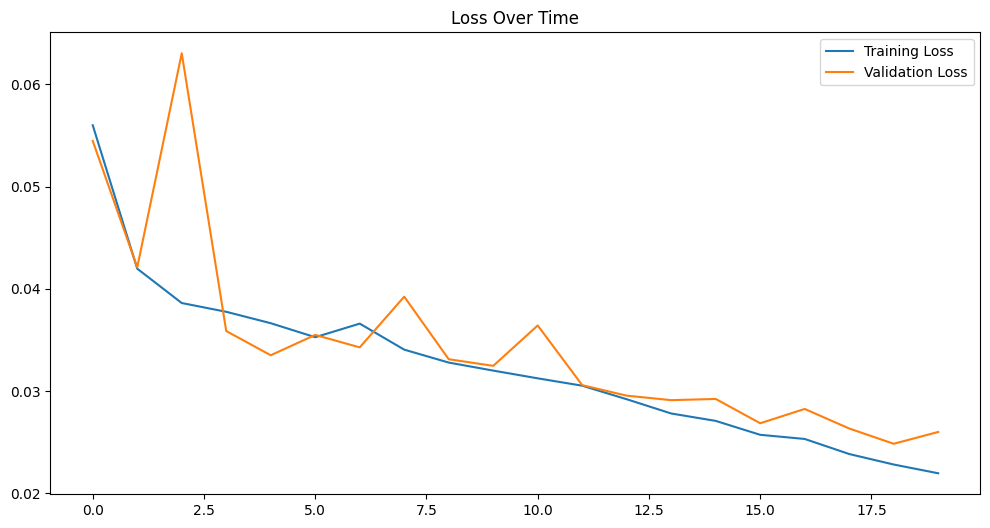

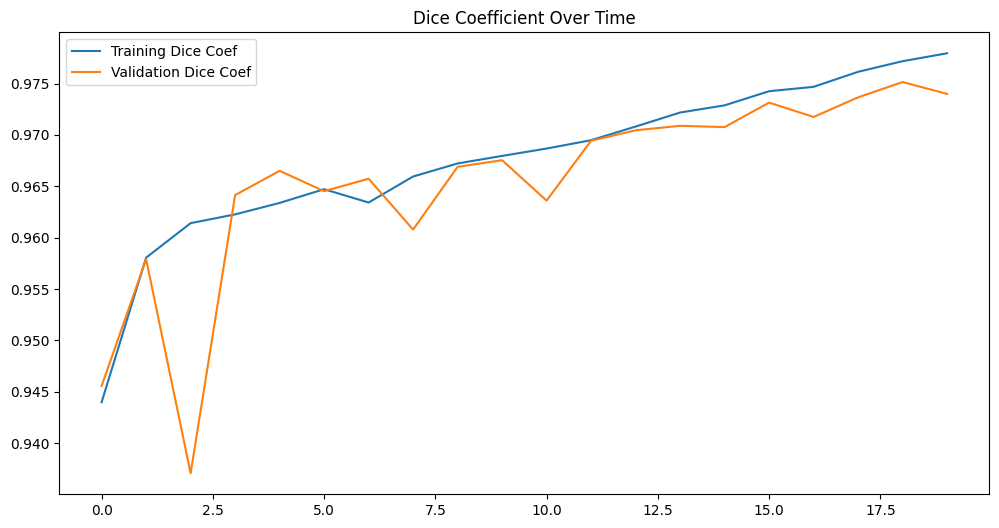

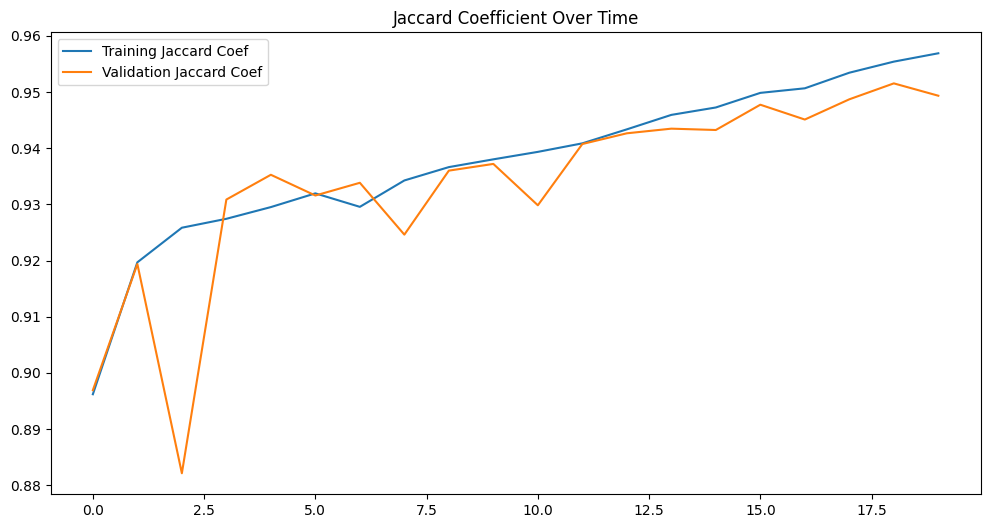

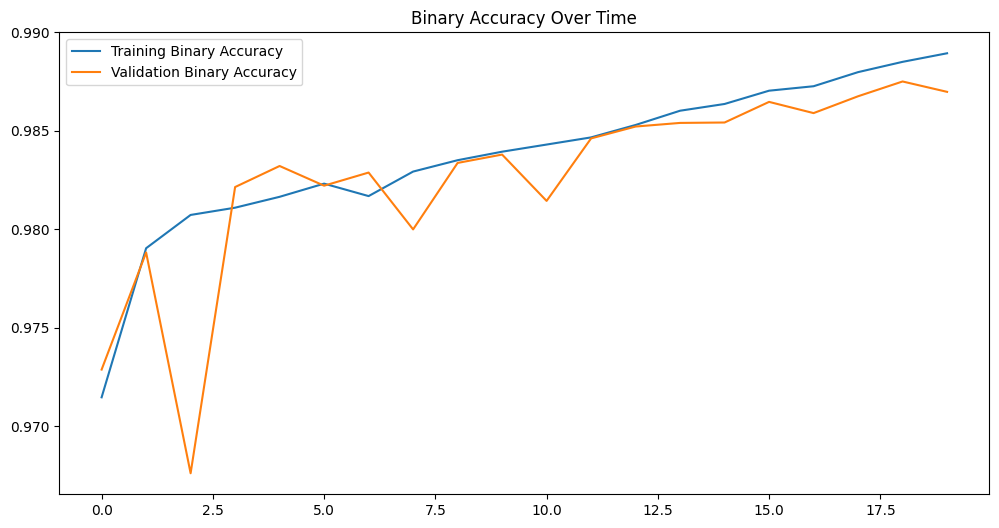

In [18]:
# Plot the loss
plt.figure(figsize=(12, 6))
plt.plot(History.history['loss'], label='Training Loss')
plt.plot(History.history['val_loss'], label='Validation Loss')
plt.title('Loss Over Time')
plt.legend()
plt.show()

# Plot the dice coefficient
plt.figure(figsize=(12, 6))
plt.plot(History.history['dice_coef'], label='Training Dice Coef')
plt.plot(History.history['val_dice_coef'], label='Validation Dice Coef')
plt.title('Dice Coefficient Over Time')
plt.legend()
plt.show()

# Plot the jaccard coefficient
plt.figure(figsize=(12, 6))
plt.plot(History.history['jaccard_coef'], label='Training Jaccard Coef')
plt.plot(History.history['val_jaccard_coef'], label='Validation Jaccard Coef')
plt.title('Jaccard Coefficient Over Time')
plt.legend()
plt.show()

# Plot the binary accuracy
plt.figure(figsize=(12, 6))
plt.plot(History.history['binary_accuracy'], label='Training Binary Accuracy')
plt.plot(History.history['val_binary_accuracy'], label='Validation Binary Accuracy')
plt.title('Binary Accuracy Over Time')
plt.legend()
plt.show()


In [19]:
from keras.models import load_model
from keras.utils import custom_object_scope

# Define the custom loss and metric functions
def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + 1) / (K.sum(y_true_f) + K.sum(y_pred_f) + 1)

def dice_coef_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)

def jaccard_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) - intersection + 1.0)

def jaccard_coef_loss(y_true, y_pred):
    return 1 - jaccard_coef(y_true, y_pred)

# Load the model within the custom object scope
with custom_object_scope({'dice_coef': dice_coef, 'dice_coef_loss': dice_coef_loss, 'jaccard_coef_loss': jaccard_coef_loss, 'jaccard_coef': jaccard_coef}):
    model = load_model('/content/best_model.h5')



## Visualization of Chest X-Ray Segmentation Results

In this visualization, we display a set of chest X-ray images along with their corresponding predicted masks and actual ground truth masks. The purpose is to evaluate the performance of the segmentation model.

### Components:

1. **Original Chest X-Ray (CXR)**:
    - The leftmost column shows the original chest X-ray images.
    - These images represent the input data for the segmentation model.

2. **Predicted Mask**:
    - The middle column displays the predicted binary masks generated by the model.
    - These masks highlight the regions predicted as abnormal (e.g., pneumonia, tumors).

3. **Actual Mask (Ground Truth)**:
    - The rightmost column shows the ground truth binary masks.
    - These masks represent the actual abnormal regions annotated by experts.

### Interpretation:

- Compare the predicted masks with the actual masks to assess the model's accuracy in identifying abnormal regions.
- Ideally, the predicted masks should closely align with the actual masks.

### Usage Considerations:

- Use this visualization to qualitatively evaluate the segmentation model's performance.
- Adjust the number of displayed examples (`10` in this case) based on your preference.

Remember that quantitative metrics (such as Dice coefficient or Jaccard index) should also be used for a comprehensive evaluation.

27/27 [==============================] - 24s 455ms/step


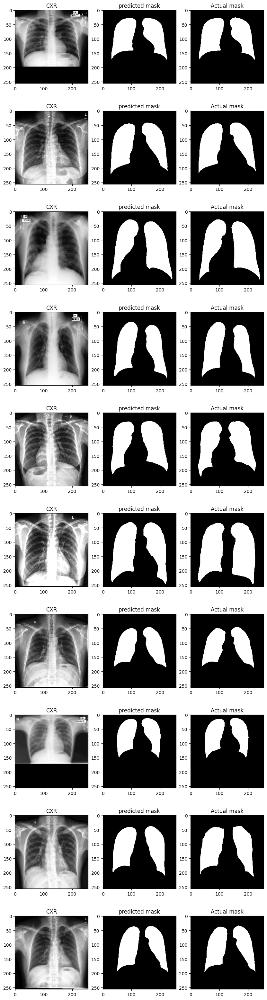

In [20]:
preds_val = model.predict(X_val)

fig, axs = plt.subplots(nrows=10, ncols=3, figsize=(10, 40))  # Increase the number of rows to 10

for i in range(10):  # Change the range to 10
    for j in range(3):
        if j == 0:
            axs[i, j].imshow(X_val[i + 10].reshape(256, 256), cmap='gray')
            axs[i, j].set_title('CXR')
        elif j == 1:
            axs[i, j].imshow(preds_val[i + 10].reshape(256, 256), cmap='gray')
            axs[i, j].set_title('predicted mask')
        elif j == 2:
            axs[i, j].imshow(Y_val[i + 10].reshape(256, 256), cmap='gray')
            axs[i, j].set_title('Actual mask')



## Visualization of Predicted Masks for Chest X-Rays

In this visualization, we display a set of chest X-ray images alongside their corresponding predicted binary masks. The purpose is to evaluate how well the model identifies abnormal regions in the X-rays.

### Components:

1. **Chest X-Ray (CXR)**:
    - The left column shows the original chest X-ray images.
    - These images represent the input data for the segmentation model.

2. **Predicted Mask**:
    - The right column displays the predicted binary masks generated by the model.
    - These masks highlight the regions predicted as abnormal (e.g., pneumonia, tumors).

### Interpretation:

- Compare the predicted masks with the original X-rays to assess the model's accuracy in identifying abnormal regions.
- Ideally, the predicted masks should closely align with the actual abnormalities present in the X-rays.

### Usage Considerations:

- Use this visualization to qualitatively evaluate the segmentation model's performance on unseen test data.
- Adjust the number of displayed examples (`10` in this case) based on your preference.



2/2 [==============================] - 9s 9s/step


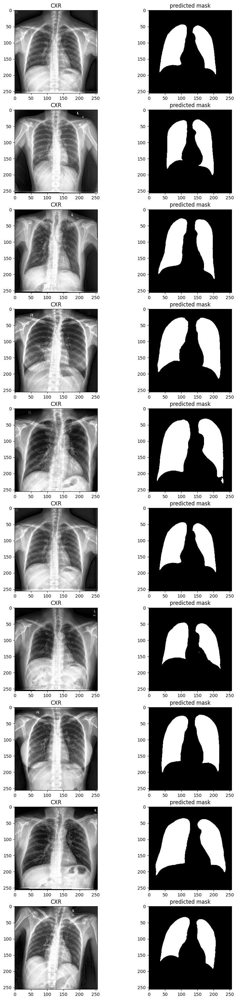

In [21]:
preds = model.predict(X_testNorm)

fig, axs = plt.subplots(nrows=10, ncols=2, figsize=(10, 40))  # Increase the number of rows to 10

for i in range(10):  # Change the range to 10
    for j in range(2):
        if j != 1:
            axs[i, j].imshow(X_testNorm[i + 10].reshape(256, 256), cmap='gray')
            axs[i, j].set_title('CXR')
        else:
            axs[i, j].imshow(preds[i + 10].reshape(256, 256), cmap='gray')
            axs[i, j].set_title('predicted mask')



## ResUNet1 Architecture

1. **Input Layer**:
    - The model takes grayscale chest X-ray images as input, with dimensions `(256, 256, 1)`.

2. **Encoder (Downsampling Path)**:
    - The encoder gradually reduces spatial dimensions while capturing hierarchical features:
        - **Stem Block**: The initial convolutional layer processes the input image.
        - **Residual Blocks**: Four residual blocks downsample the feature maps, capturing context and learning discriminative features.
        - **Depthwise Separable Convolution**:
            - Depthwise convolution applies a separate convolution to each input channel.
            - Pointwise convolution combines the results across channels.
            - This reduces the number of parameters and computational cost.

3. **Bridge**:
    - The bridge connects the encoder and decoder:
        - Two convolutional layers maintain spatial resolution and context.

4. **Decoder (Upsampling Path)**:
    - The decoder gradually increases spatial dimensions while recovering fine details:
        - **Upsample and Concatenate Blocks**: Four blocks upsample the feature maps and concatenate them with corresponding encoder feature maps.
        - **Residual Blocks**: Four residual blocks further refine the features.

5. **Output Layer**:
    - A 1x1 convolutional layer with sigmoid activation produces the final binary mask.
    - The output represents the predicted abnormal regions in the chest X-ray.

## Depthwise Separable Convolution:
- Depthwise separable convolution is computationally efficient and reduces overfitting.
- It is particularly useful for mobile and resource-constrained applications.

## Usage Considerations:
- Customize the model architecture by adjusting hyperparameters (e.g., filters, kernel size) based on your specific task and dataset.
- Train the ResUNet1 using appropriate loss functions (e.g., Dice coefficient, Jaccard index) and optimization techniques.


In [2]:
import tensorflow.keras.layers as layers
import tensorflow.keras.models as models

def batch_norm_activation(x, activation=True):
    x = layers.BatchNormalization()(x)
    if activation:
        x = layers.Activation("relu")(x)
    return x

def depthwise_conv_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    x = batch_norm_activation(x)
    x = layers.DepthwiseConv2D(kernel_size, padding=padding, strides=strides)(x)
    x = layers.Conv2D(filters, (1, 1), padding="same")(x)
    return x


def stem_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    x = depthwise_conv_block(x, filters, kernel_size=kernel_size, padding=padding, strides=strides)
    x = depthwise_conv_block(x, filters, kernel_size=kernel_size, padding=padding, strides=strides)

    shortcut = layers.Conv2D(filters, kernel_size=(1, 1), padding=padding, strides=strides)(x)
    shortcut = batch_norm_activation(shortcut, activation=False)

    x = layers.Add()([x, shortcut])
    return x

def residual_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    res = depthwise_conv_block(x, filters, kernel_size=kernel_size, padding=padding, strides=strides)
    res = depthwise_conv_block(res, filters, kernel_size=kernel_size, padding=padding, strides=1)

    shortcut = layers.Conv2D(filters, kernel_size=(1, 1), padding=padding, strides=strides)(x)
    shortcut = batch_norm_activation(shortcut, activation=False)

    x = layers.Add()([shortcut, res])
    return x


def upsample_concat_block(x, xskip):
    u = layers.UpSampling2D((2, 2))(x)
    c = layers.Concatenate()([u, xskip])
    return c

def batch_norm_activation(x, activation=True):
    x = layers.BatchNormalization()(x)
    if activation:
        x = layers.Activation("relu")(x)
    return x

In [3]:
def ResUNet1():
    filters = [16, 32, 64, 128, 256]
    inputs = layers.Input((dim, dim, 1))

    # Encoder
    e0 = inputs
    e1 = stem_block(e0, filters[0])
    e2 = residual_block(e1, filters[1], strides=2)
    e3 = residual_block(e2, filters[2], strides=2)
    e4 = residual_block(e3, filters[3], strides=2)
    e5 = residual_block(e4, filters[4], strides=2)

    # Bridge
    b0 = depthwise_conv_block(e5, filters[4], strides=1)
    b1 = depthwise_conv_block(b0, filters[4], strides=1)

    # Decoder
    u1 = upsample_concat_block(b1, e4)
    d1 = residual_block(u1, filters[4])

    u2 = upsample_concat_block(d1, e3)
    d2 = residual_block(u2, filters[3])

    u3 = upsample_concat_block(d2, e2)
    d3 = residual_block(u3, filters[2])

    u4 = upsample_concat_block(d3, e1)
    d4 = residual_block(u4, filters[1])

    outputs = layers.Conv2D(1, (1, 1), padding="same", activation="sigmoid")(d4)
    model = models.Model(inputs, outputs)
    return model

In [16]:
metrics = [dice_coef, jaccard_coef,
           'binary_accuracy',
           tf.keras.metrics.Precision(),
           tf.keras.metrics.Recall()]

loss = [dice_coef_loss,
        jaccard_coef_loss,
        'binary_crossentropy']

model2 = ResUNet1()

adam = tensorflow.keras.optimizers.Adam()
model2.compile(optimizer=adam, loss=loss, metrics=metrics)
model2.summary()

# Define the model checkpoint callback
model_checkpoint = ModelCheckpoint('best_model_DepthWise.h5', monitor='val_loss',
                                   save_best_only=True, verbose=1, mode='min')
callbacks_list = [model_checkpoint]


# Define the learning rate schedule function
def lr_schedule(epoch, lr):
    if epoch < 1:
        return 0.001
    else:
        return 0.001 * tf.math.exp(0.05 * (1 - epoch))

# Create the LearningRateScheduler callback
lr_scheduler = LearningRateScheduler(lr_schedule)

# Add the LearningRateScheduler to the callbacks list
callbacks_list.append(lr_scheduler)


# Fit the model with the defined callbacks
History = model2.fit(X_train, Y_train,
                validation_data=(X_val, Y_val),
                batch_size=8, epochs=20,
                callbacks=callbacks_list)



Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 batch_normalization (Batch  (None, 256, 256, 1)          4         ['input_1[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 256, 256, 1)          0         ['batch_normalization[0][0]'] 
                                                                                                  
 depthwise_conv2d (Depthwis  (None, 256, 256, 1)          10        ['activation[0][0]']      

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


423/423 [==============================] - 128s 216ms/step - loss: 0.0816 - dice_coef: 0.9184 - jaccard_coef: 0.8562 - binary_accuracy: 0.9557 - precision: 0.8993 - recall: 0.9287 - val_loss: 0.6912 - val_dice_coef: 0.3082 - val_jaccard_coef: 0.1846 - val_binary_accuracy: 0.7948 - val_precision: 0.9891 - val_recall: 0.1846 - lr: 0.0010
Epoch 2/20
423/423 [==============================] - ETA: 0s - loss: 0.0465 - dice_coef: 0.9535 - jaccard_coef: 0.9114 - binary_accuracy: 0.9768 - precision: 0.9598 - recall: 0.9480
Epoch 2: val_loss improved from 0.69119 to 0.04476, saving model to best_model_DepthWise.h5
423/423 [==============================] - 86s 203ms/step - loss: 0.0465 - dice_coef: 0.9535 - jaccard_coef: 0.9114 - binary_accuracy: 0.9768 - precision: 0.9598 - recall: 0.9480 - val_loss: 0.0448 - val_dice_coef: 0.9553 - val_jaccard_coef: 0.9145 - val_binary_accuracy: 0.9779 - val_precision: 0.9634 - val_recall: 0.9480 - lr: 0.0010
Epoch 3/20
423/423 [==============================

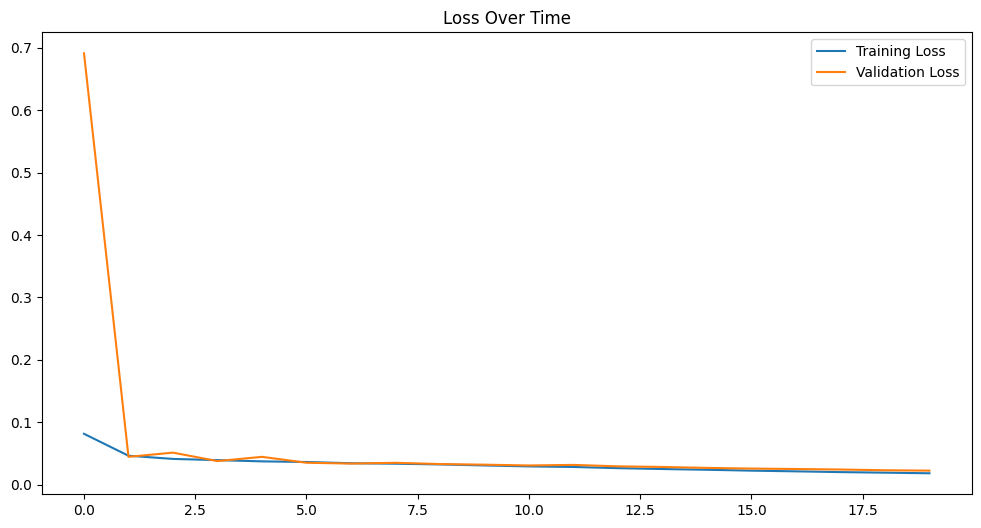

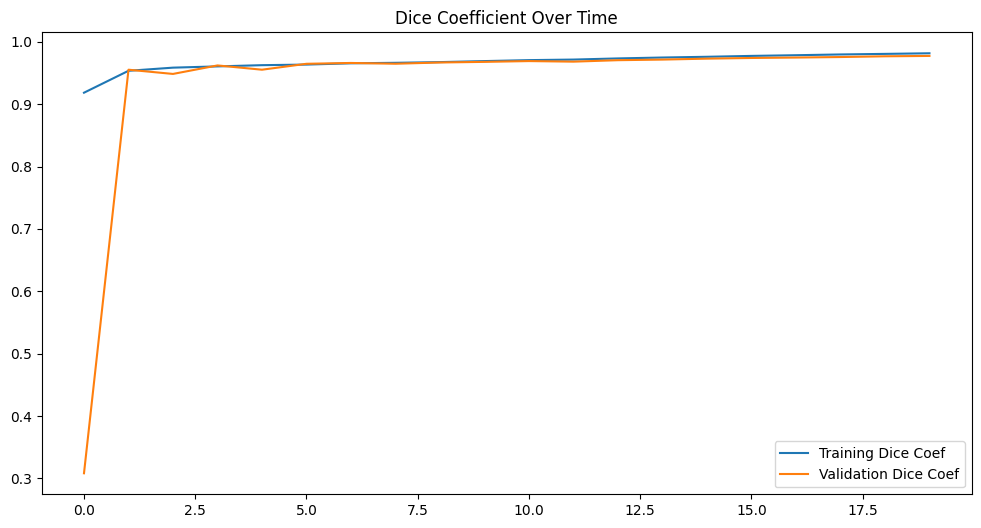

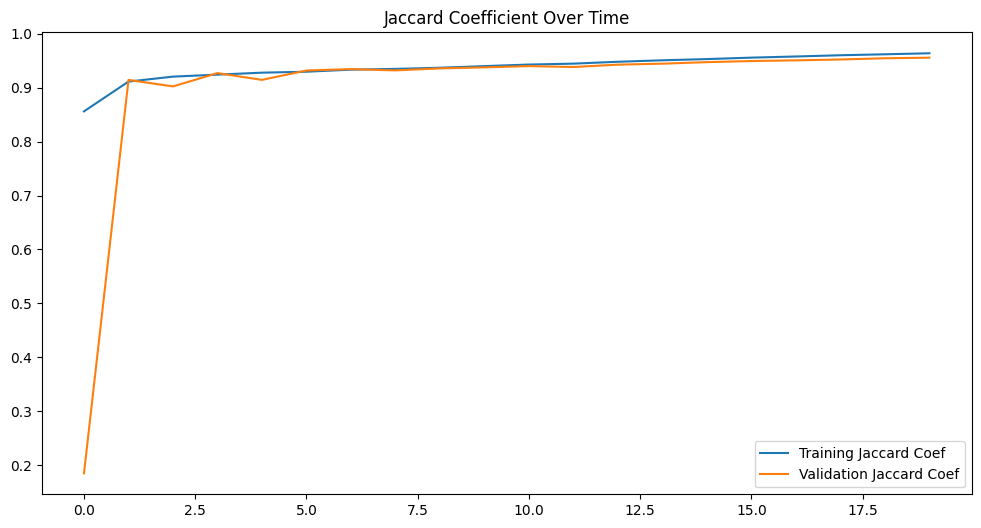

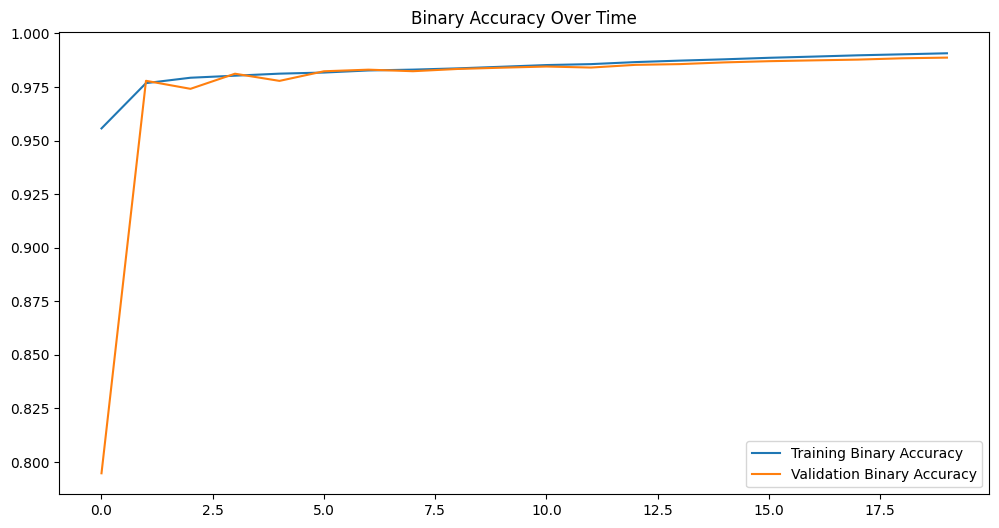

In [17]:
# Plot the loss
plt.figure(figsize=(12, 6))
plt.plot(History.history['loss'], label='Training Loss')
plt.plot(History.history['val_loss'], label='Validation Loss')
plt.title('Loss Over Time')
plt.legend()
plt.show()

# Plot the dice coefficient
plt.figure(figsize=(12, 6))
plt.plot(History.history['dice_coef'], label='Training Dice Coef')
plt.plot(History.history['val_dice_coef'], label='Validation Dice Coef')
plt.title('Dice Coefficient Over Time')
plt.legend()
plt.show()

# Plot the jaccard coefficient
plt.figure(figsize=(12, 6))
plt.plot(History.history['jaccard_coef'], label='Training Jaccard Coef')
plt.plot(History.history['val_jaccard_coef'], label='Validation Jaccard Coef')
plt.title('Jaccard Coefficient Over Time')
plt.legend()
plt.show()

# Plot the binary accuracy
plt.figure(figsize=(12, 6))
plt.plot(History.history['binary_accuracy'], label='Training Binary Accuracy')
plt.plot(History.history['val_binary_accuracy'], label='Validation Binary Accuracy')
plt.title('Binary Accuracy Over Time')
plt.legend()
plt.show()


# Load and Test The Best Model 2

In [18]:
from keras.models import load_model
from keras.utils import custom_object_scope

# Define the custom loss and metric functions
def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + 1) / (K.sum(y_true_f) + K.sum(y_pred_f) + 1)

def dice_coef_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)

def jaccard_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) - intersection + 1.0)

def jaccard_coef_loss(y_true, y_pred):
    return 1 - jaccard_coef(y_true, y_pred)

# Load the model within the custom object scope
with custom_object_scope({'dice_coef': dice_coef, 'dice_coef_loss': dice_coef_loss, 'jaccard_coef_loss': jaccard_coef_loss, 'jaccard_coef': jaccard_coef}):
    model2 = load_model('/content/best_model_DepthWise.h5')


27/27 [==============================] - 11s 272ms/step


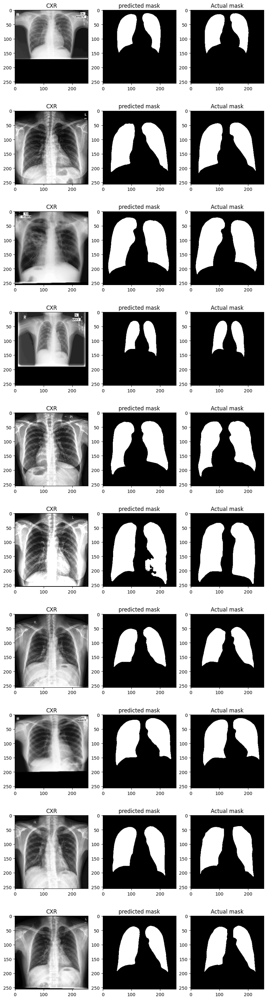

In [19]:
preds_val2 = model2.predict(X_val)

fig, axs = plt.subplots(nrows=10, ncols=3, figsize=(10, 40))  # Increase the number of rows to 10

for i in range(10):  # Change the range to 10
    for j in range(3):
        if j == 0:
            axs[i, j].imshow(X_val[i + 10].reshape(256, 256), cmap='gray')
            axs[i, j].set_title('CXR')
        elif j == 1:
            axs[i, j].imshow(preds_val2[i + 10].reshape(256, 256), cmap='gray')
            axs[i, j].set_title('predicted mask')
        elif j == 2:
            axs[i, j].imshow(Y_val[i + 10].reshape(256, 256), cmap='gray')
            axs[i, j].set_title('Actual mask')


2/2 [==============================] - 3s 2s/step


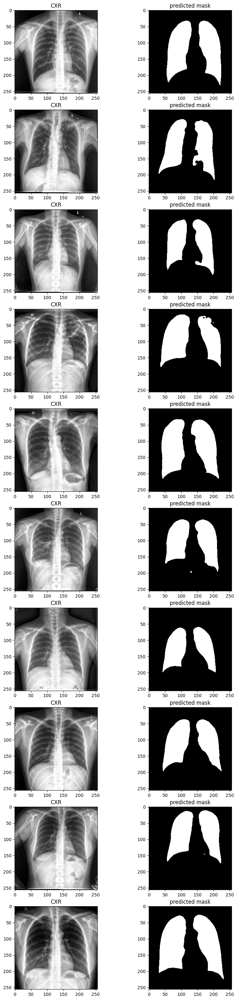

In [20]:
preds2 = model2.predict(X_testNorm)

fig, axs = plt.subplots(nrows=10, ncols=2, figsize=(10, 40))  # Increase the number of rows to 10

for i in range(10):  # Change the range to 10
    for j in range(2):
        if j != 1:
            axs[i, j].imshow(X_testNorm[i + 10].reshape(256, 256), cmap='gray')
            axs[i, j].set_title('CXR')
        else:
            axs[i, j].imshow(preds2[i + 10].reshape(256, 256), cmap='gray')
            axs[i, j].set_title('predicted mask')




## Conclusion: Chest X-Ray Mask Segmentation

In our journey to segment chest X-ray masks, we explored two variants of the ResNet architecture: one with conventional CNN layers and another with depthwise separable convolutions. Here are our findings:

1. **Depthwise Separable ResNet**:
    - **Stability in Learning Process**:
        - Depthwise separable convolutions offer computational efficiency and stability during training.
        - They reduce the risk of overfitting and improve convergence.
    - **Trade-Offs**:
        - While stability is advantageous, the model's predictions may lack fine-grained details.
        - Depthwise separable layers sacrifice expressiveness for efficiency.
    - **Recommendation**:
        - Use depthwise separable convolutions when computational resources are limited or stability is crucial.

2. **Conventional ResNet**:
    - **Reasonable Predicted Masks**:
        - The conventional ResNet captures richer features and produces more reasonable predicted masks.
        - It excels at identifying intricate patterns and abnormalities.
    - **Trade-Offs**:
        - Higher computational cost and potential overfitting.
        - Requires careful tuning and regularization.
    - **Recommendation**:
        - Choose conventional ResNet when detailed predictions are essential.

3. **Augmentation Importance**:
    - Augmentation techniques (such as flipping) significantly enhance model performance.
    - They increase dataset diversity, improve generalization, and prevent overfitting.

In summary, both architectures have their merits. Depthwise separable convolutions provide stability, while conventional CNNs yield more interpretable results. Augmentation remains a crucial part of the process.

Remember that no single model fits all scenarios. Adapt your choice based on the specific task, available resources, and desired trade-offs. Keep iterating, experimenting, and advancing medical imaging research! 🌟👩‍⚕️🔍

Feel free to explore further and continue refining your approach. Best wishes on your journey! 🧠💡👨‍💻